<a href="https://colab.research.google.com/github/Yuchan002/F55122020_Syafa-at-Ramadhan/blob/main/quizPCD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [18]:
#import libray
import cv2
import numpy as np
from PIL import Image
import random
from google.colab.patches import cv2_imshow

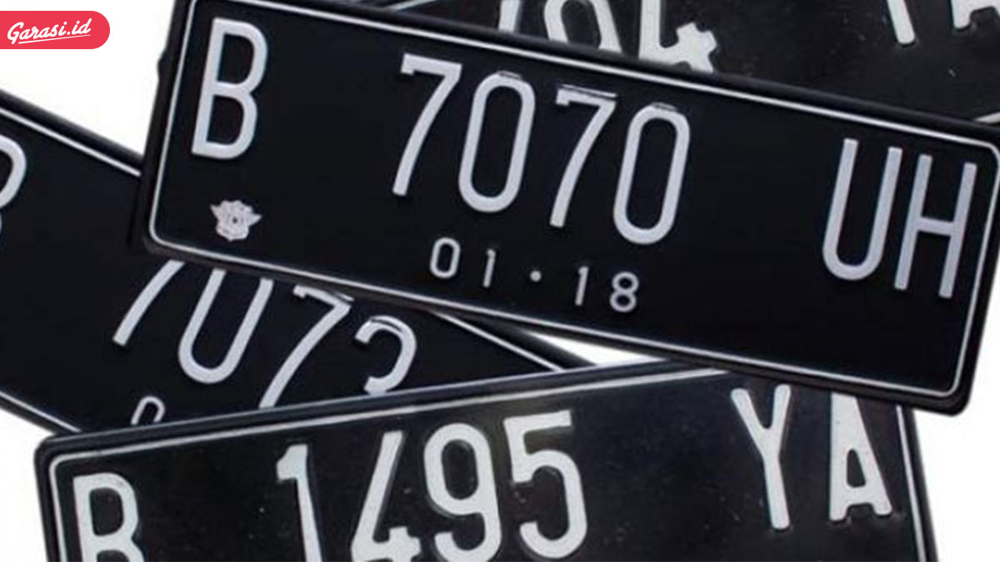

In [20]:
# Baca gambar menggunakan OpenCV
image_cv2 = cv2.imread('/content/gambar plat nomor.jpeg')
cv2_imshow(image_cv2)

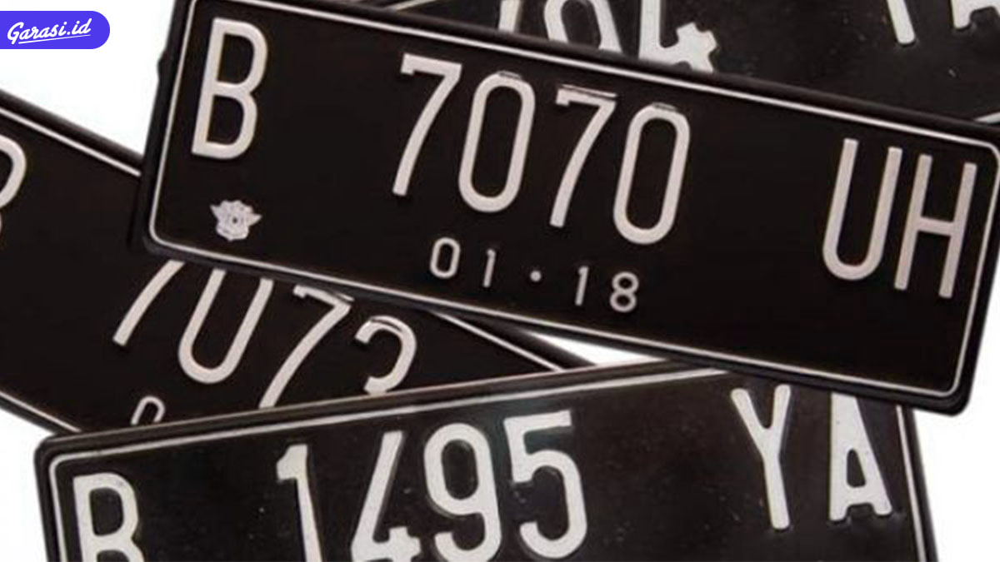

In [21]:

#Baca gambar menggunakan PIL
image_pil = Image.open('/content/gambar plat nomor.jpeg')
cv2_imshow(np.array(image_pil))

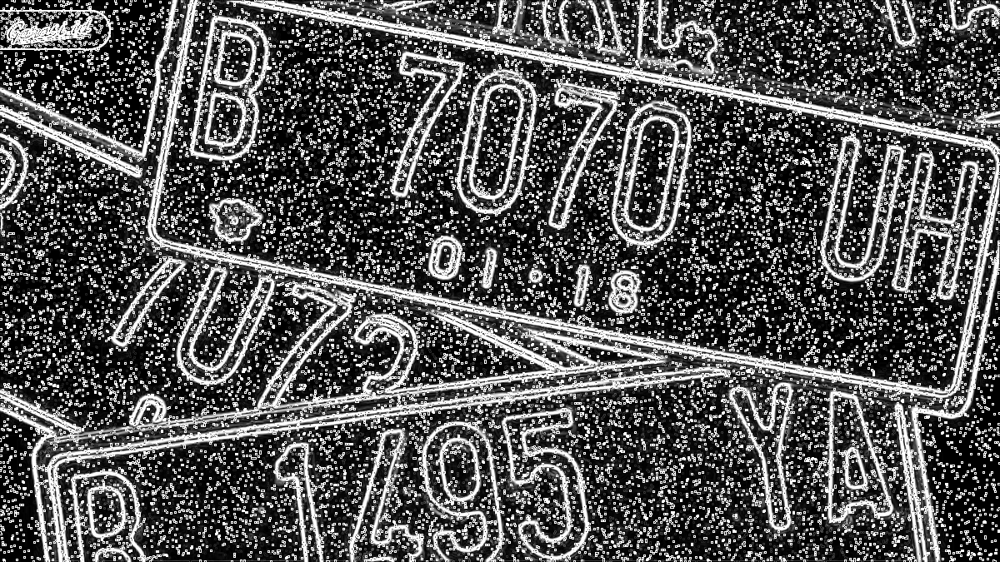

In [26]:
#Deteksi tepi menggunakan Sobel
gray_image = cv2.cvtColor(image_cv2, cv2.COLOR_BGR2GRAY)
sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
sobel_edges = np.sqrt(sobel_x**2 + sobel_y**2)
sobel_edges = cv2.convertScaleAbs(sobel_edges)

cv2_imshow(sobel_edges)


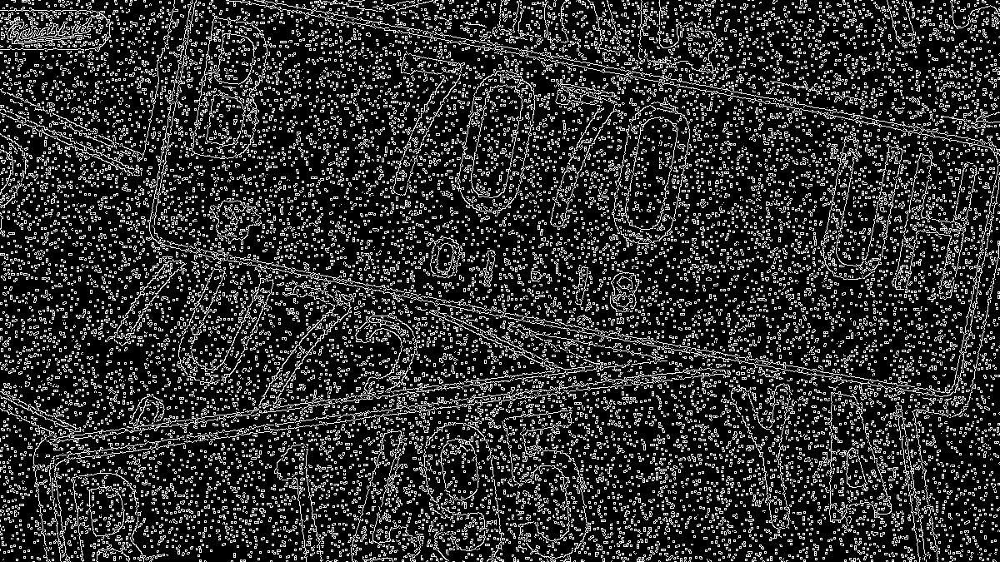

In [27]:
#Deteksi tepi menggunakan Canny
canny_edges = cv2.Canny(gray_image, 100, 200)

cv2_imshow(canny_edges)

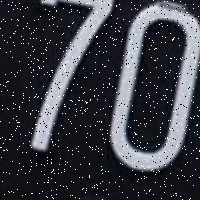

In [29]:
#Fungsi untuk melakukan cropping secara acak
def random_crop(image, crop_size):
    height, width = image.shape[:2]
    x = random.randint(0, width - crop_size[1])
    y = random.randint(0, height - crop_size[0])
    cropped_image = image[y:y+crop_size[0], x:x+crop_size[1]]
    return cropped_image

#Fungsi untuk melakukan center cropping dengan setengah ukuran
def center_crop_half_size(image):
    height, width = image.shape[:2]
    crop_width = width // 2
    crop_height = height // 2
    center_x = width // 2
    center_y = height // 2
    cropped_image = image[center_y-crop_height//2:center_y+crop_height//2, center_x-crop_width//2:center_x+crop_width//2]
    return cropped_image

#Lakukan random cropping
cropped_random = random_crop(image_cv2, (200, 200))
cv2_imshow(cropped_random)

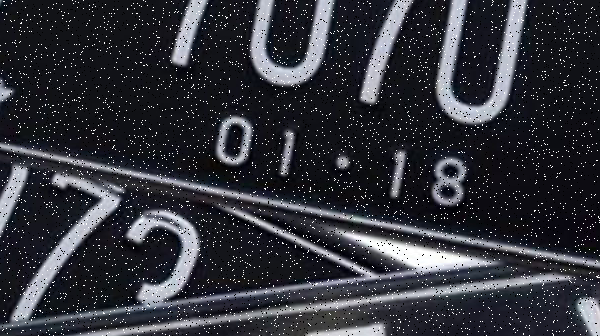

In [30]:
#Lakukan center cropping dengan setengah ukuran
cropped_center_half = center_crop_half_size(image_cv2)
cv2_imshow(cropped_center_half)

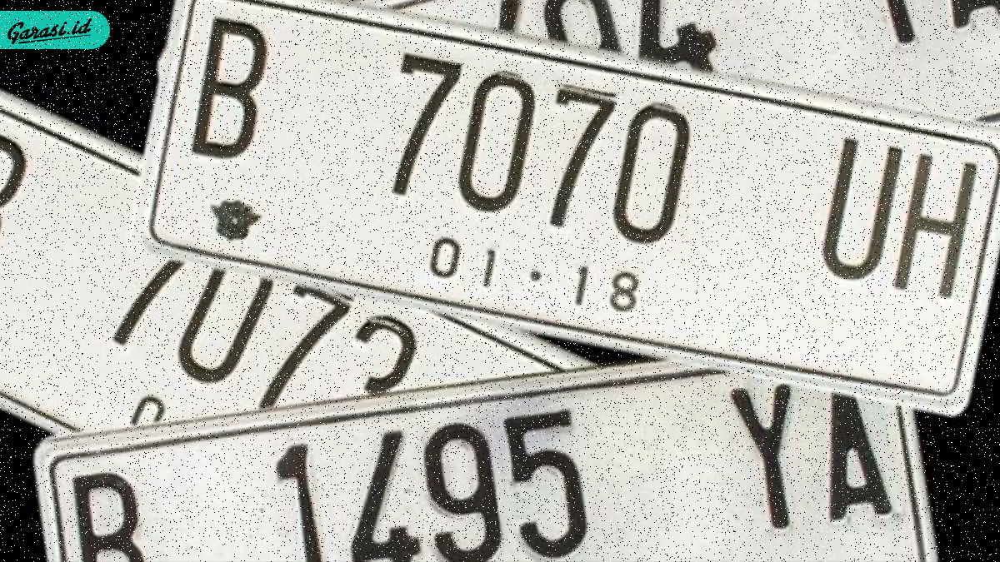

In [31]:
#Lakukan transformasi warna
inverted_image = cv2.bitwise_not(image_cv2)
cv2_imshow(inverted_image)

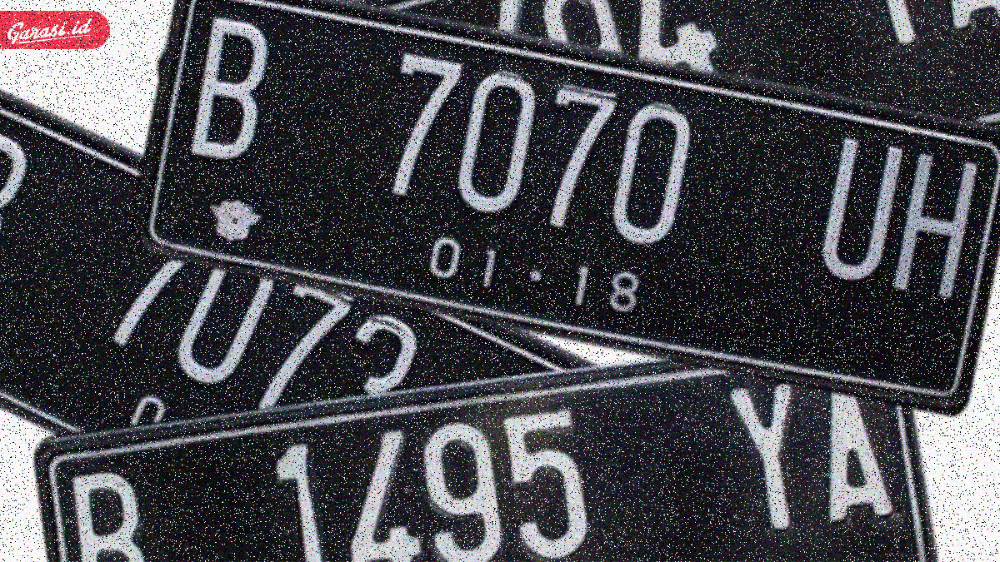

In [32]:
#Tambahkan noise pada gambar asli
def add_noise(image):
    # Salt and Pepper Noise
    salt_pepper = 0.05
    random_mask = np.random.rand(image.shape[0], image.shape[1])
    image[random_mask < salt_pepper/2] = 0
    image[random_mask > 1 - salt_pepper/2] = 255

    # Gaussian Noise
    gaussian_noise = np.random.normal(0, 20, size=image.shape)
    noisy_image = np.clip(image + gaussian_noise, 0, 255).astype(np.uint8)
    return noisy_image

noisy_image = add_noise(image_cv2)
cv2_imshow(noisy_image)

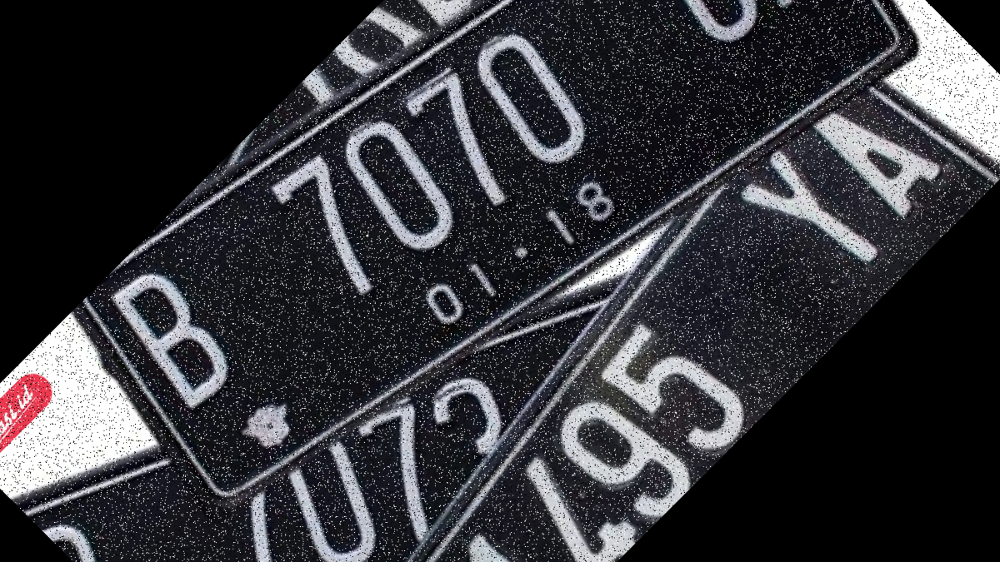

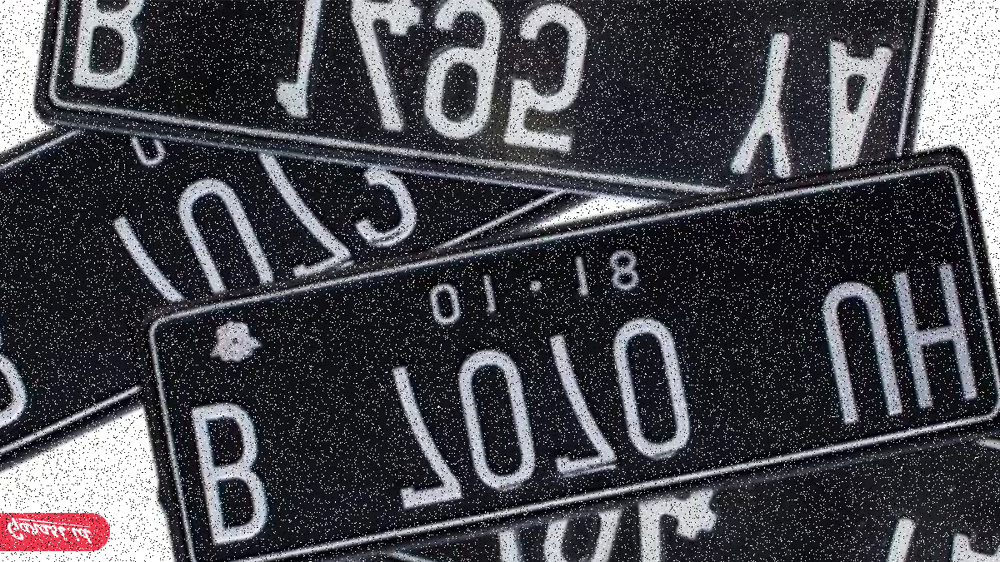

In [35]:
#Lakukan transformasi geometri
# Rotasi
rows, cols = image_cv2.shape[:2]
rotation_matrix = cv2.getRotationMatrix2D((cols/2, rows/2), 45, 1)  # Rotasi 45 derajat
rotated_image = cv2.warpAffine(image_cv2, rotation_matrix, (cols, rows))
cv2_imshow(rotated_image)


# Flip Vertikal
flipped_vertical = cv2.flip(image_cv2, 0)
cv2_imshow(flipped_vertical)

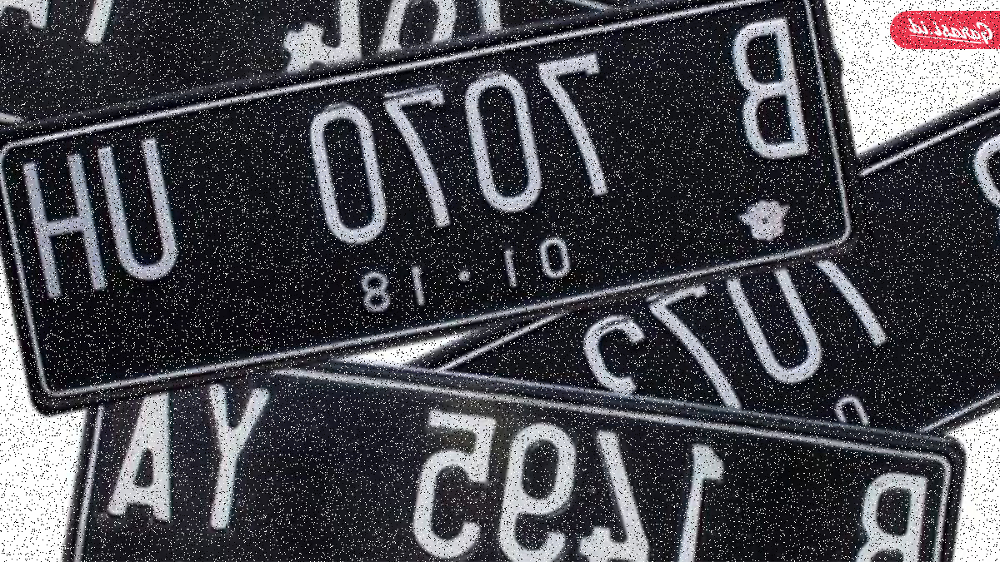

In [36]:
#Flip Horizontal
flipped_horizontal = cv2.flip(image_cv2, 1)
cv2_imshow(flipped_horizontal)